In [80]:
import numpy as np 
import pandas as pd 
from sklearn.metrics import confusion_matrix 
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 
from sklearn.preprocessing import LabelEncoder 
import matplotlib.pyplot as plt
%matplotlib inline

In [83]:
data_1=pd.read_csv("bank-additional-full.csv",sep=";")
data_2=pd.read_csv("bank-additional.csv",sep=";")
data=pd.concat([data_1,data_2],axis=0)

data.head()


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
#hist plot of all numeric varibales

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:635: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item_labels[indexer[info_axis]]] = value


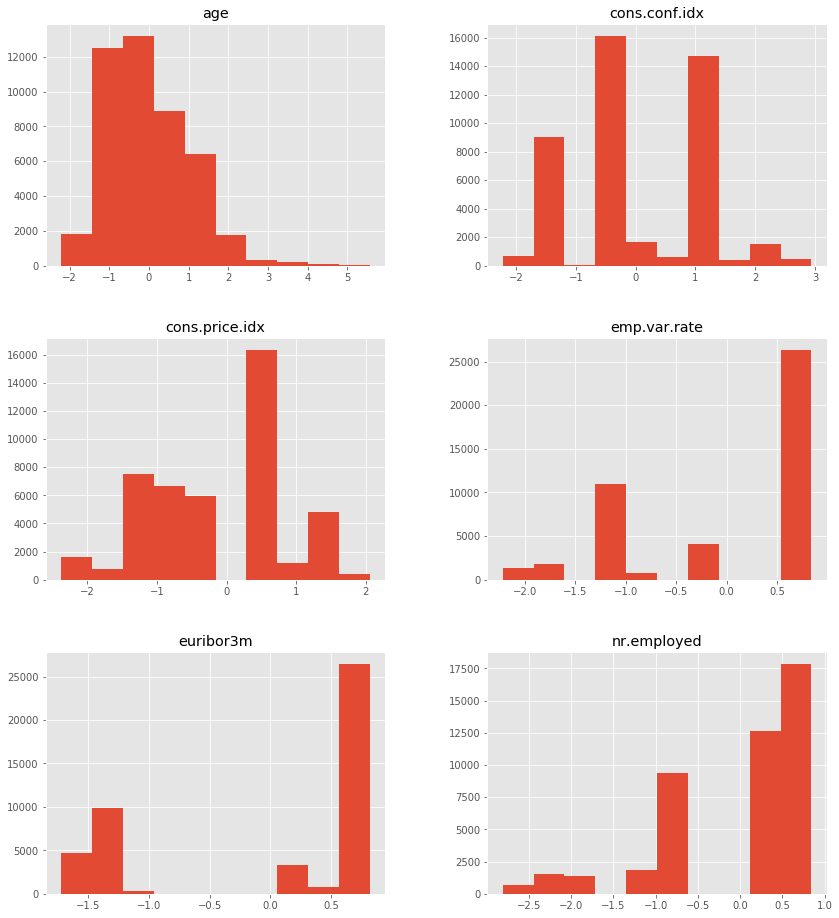

In [77]:
for index in range(6):
    data_int1.iloc[:,index] = (data_int1.iloc[:,index]-data_int1.iloc[:,index].mean()) / data_int1.iloc[:,index].std();
data_int1.hist(figsize= (14,16));

In [86]:
#To avoid mulicorinality drop the higly correltaed column
data = data.drop(["emp.var.rate","nr.employed"],axis=1)
data.head()


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,cons.price.idx,cons.conf.idx,euribor3m,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,93.994,-36.4,4.857,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,93.994,-36.4,4.857,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,93.994,-36.4,4.857,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,93.994,-36.4,4.857,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,93.994,-36.4,4.857,no


In [ ]:
#Data Preprocess - One-hot-encoding & label-encoding

In [87]:
jobDummies = pd.get_dummies(data['job'], prefix = 'job')
maritalDummies = pd.get_dummies(data['marital'], prefix = 'marital')
educationDummies = pd.get_dummies(data['education'], prefix = 'education')
defaultDummies = pd.get_dummies(data['default'], prefix = 'default')
housingDummies = pd.get_dummies(data['housing'], prefix = 'housing')
loanDummies = pd.get_dummies(data['loan'], prefix = 'loan')
contactDummies = pd.get_dummies(data['contact'], prefix = 'contact')
poutcomeDummies = pd.get_dummies(data['poutcome'], prefix = 'poutcome')
data['month']=data['month'].astype('category')
data['day_of_week']=data['day_of_week'].astype('category')
data['y']=data['y'].astype('category')

# Assigning numerical values and storing in another column
data['month'] = data['month'].cat.codes
data['day_of_week'] = data['day_of_week'].cat.codes
data['y'] = data['y'].cat.codes

#data['day_of_week']
data['y'].dtype

dtype('int8')

In [88]:
data["age"]=data["age"].astype("int")
data["duration"]=data["duration"].astype("int")
data["pdays"]=data["pdays"].astype("int")
data["previous"]=data["previous"].astype("int")
data["campaign"]=data["campaign"].astype("int")

data_int=data.select_dtypes(include=['int','float64','bool'])
#data_int
bank_df=pd.concat([data_int,jobDummies,maritalDummies,educationDummies,defaultDummies,housingDummies,loanDummies
                  ,contactDummies,poutcomeDummies,data['month'],data['day_of_week'],data['y']],axis=1)
bank_df.head()

,age,duration,campaign,pdays,previous,cons.price.idx,cons.conf.idx,euribor3m,job_admin.,job_blue-collar,...,loan_unknown,loan_yes,contact_cellular,contact_telephone,poutcome_failure,poutcome_nonexistent,poutcome_success,month,day_of_week,y
0,56,261,1,999,0,93.994,-36.4,4.857,0,0,...,0,0,0,1,0,1,0,6,1,0
1,57,149,1,999,0,93.994,-36.4,4.857,0,0,...,0,0,0,1,0,1,0,6,1,0
2,37,226,1,999,0,93.994,-36.4,4.857,0,0,...,0,0,0,1,0,1,0,6,1,0
3,40,151,1,999,0,93.994,-36.4,4.857,1,0,...,0,0,0,1,0,1,0,6,1,0
4,56,307,1,999,0,93.994,-36.4,4.857,0,0,...,0,1,0,1,0,1,0,6,1,0


In [89]:
features = bank_df.columns
features=features[:48]
print(features)

Index(['age', 'duration', 'campaign', 'pdays', 'previous', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'job_admin.', 'job_blue-collar',
       'job_entrepreneur', 'job_housemaid', 'job_management', 'job_retired',
       'job_self-employed', 'job_services', 'job_student', 'job_technician',
       'job_unemployed', 'job_unknown', 'marital_divorced', 'marital_married',
       'marital_single', 'marital_unknown', 'education_basic.4y',
       'education_basic.6y', 'education_basic.9y', 'education_high.school',
       'education_illiterate', 'education_professional.course',
       'education_university.degree', 'education_unknown', 'default_no',
       'default_unknown', 'default_yes', 'housing_no', 'housing_unknown',
       'housing_yes', 'loan_no', 'loan_unknown', 'loan_yes',
       'contact_cellular', 'contact_telephone', 'poutcome_failure',
       'poutcome_nonexistent', 'poutcome_success', 'month', 'day_of_week'],
      dtype='object')


In [91]:
#variables and predictors
y=np.array(bank_df["y"])
X=np.array(bank_df.iloc[:,0:48])

In [ ]:
#Train/Test split

In [92]:

from sklearn.model_selection import train_test_split

X_train_80, X_test, y_train_80, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


X_train, X_val, y_train, y_val = train_test_split(X_train_80, y_train_80, test_size=0.2, random_state=1)

In [ ]:
#Decision Tree

In [93]:
# Function to perform training with entropy. 
def tarin_using_entropy(X_train, y_train, max_depth=5): 
  
    # Decision tree with entropy 
    clf_entropy = DecisionTreeClassifier( 
            criterion = "entropy", random_state = 100
            ,max_depth = max_depth, min_samples_leaf  = 5) 
  
    # Performing training 
    clf_entropy.fit(X_train, y_train) 
    return clf_entropy

# Function to perform training with entropy. 
def tarin_using_gini(X_train, y_train, max_depth=5): 
  
    # Decision tree with entropy 
    clf_gini = DecisionTreeClassifier( 
            criterion = "gini", random_state = 100
            ,max_depth = max_depth, min_samples_leaf  = 5,splitter='best') 
  
    # Performing training 
    clf_gini.fit(X_train, y_train) 
    return clf_gini

# Function to make predictions 
def prediction(X, clf_object): 
  
    # Predicton on test with giniIndex 
    y_pred = clf_object.predict(X) 
    print("Predicted values:") 
    print(y_pred) 
    return y_pred 

# Function to calculate accuracy 
def cal_accuracy(y_true, y_pred): 
      
    print("Confusion Matrix: ", 
        confusion_matrix(y_true, y_pred)) 
    
    accuracy=accuracy_score(y_true,y_pred)*100
    print ("Accuracy : ", accuracy) 
      
    print("Report : ", 
    classification_report(y_true, y_pred)) 
    return accuracy

#function to compute average error    
def compute_error(y_true, y_pred): 
    
    error_sum=0
    for i in range(len(y_true)):
        if y_true[i]!=y_pred[i]:
            error_sum+=1
    error= (1/len(y_true))*error_sum
    print("Error: ", error)
    return error    

In [ ]:
#Basic Run

In [10]:
clf_entropy = tarin_using_entropy(X_train_80, y_train_80)  

print("Results Using Entropy:") 
# Prediction using entropy 
y_pred_entropy = prediction(X_test, clf_entropy) 
cal_accuracy(y_test, y_pred_entropy)

Results Using Entropy:
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7849  196]
 [ 625  392]]
Accuracy :  90.94018980357536
Report :                precision    recall  f1-score   support

           0       0.93      0.98      0.95      8045
           1       0.67      0.39      0.49      1017

    accuracy                           0.91      9062
   macro avg       0.80      0.68      0.72      9062
weighted avg       0.90      0.91      0.90      9062



90.94018980357536

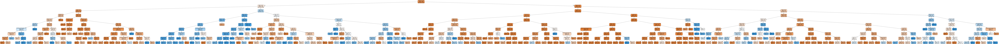

In [28]:
from IPython.display import display, Image
import pydotplus
from sklearn import tree
from sklearn.tree import _tree
from sklearn import tree
import collections
import drawtree
import os  

#os.environ["PATH"] += os.pathsep + 'C:\\Users\\User\\.conda\\pkgs\\graphviz-2.38-hfd603c8_2\\Library\\bin\\graphviz'

dot_data = tree.export_graphviz(clf_entropy, out_file = 'thisIsTheImagetree.dot',
                                 feature_names=features, filled   = True
                                    , rounded  = True
                                    , special_characters = True)

graph = pydotplus.graph_from_dot_file('thisIsTheImagetree.dot')  

thisIsTheImage = Image(graph.create_png())
display(thisIsTheImage)
#print(dt.tree_.feature)


In [ ]:
#Run for multiple max_dept to find the best value

In [15]:
max_depth=20
test_error=[]
train_error=[]
test_accuracy=[]
train_accuracy=[]
for i in range(1,max_depth+1):
    clf_entropy = tarin_using_entropy(X_train_80, y_train_80,max_depth=i)  
    print("Results Using Entropy:") 
    # Prediction using test 
    print("prediction using test for depth="+str(i))
    y_pred_test = prediction(X_test, clf_entropy) 
    test_accuracy.append(cal_accuracy(y_test, y_pred_test))
    test_error.append(compute_error(y_test, y_pred_test)*100)
    
    #prediction using Train
    print("prediction using Train for depth="+str(i))
    y_pred_train = prediction(X_train_80, clf_entropy) 
    train_accuracy.append(cal_accuracy(y_train_80, y_pred_train))
    train_error.append(compute_error(y_train_80, y_pred_train)*100)
    print(" ")
    

Results Using Entropy:
prediction using test for depth=1
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[8045    0]
 [1017    0]]
Accuracy :  88.77731185168837
Report :                precision    recall  f1-score   support

           0       0.89      1.00      0.94      8045
           1       0.00      0.00      0.00      1017

    accuracy                           0.89      9062
   macro avg       0.44      0.50      0.47      9062
weighted avg       0.79      0.89      0.83      9062

Error:  0.11222688148311631
prediction using Train for depth=1
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[32171     0]
 [ 4074     0]]
Accuracy :  88.75982894192302
Report : 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


               precision    recall  f1-score   support

           0       0.89      1.00      0.94     32171
           1       0.00      0.00      0.00      4074

    accuracy                           0.89     36245
   macro avg       0.44      0.50      0.47     36245
weighted avg       0.79      0.89      0.83     36245

Error:  0.11240171058076975
 
Results Using Entropy:
prediction using test for depth=2
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7801  244]
 [ 660  357]]
Accuracy :  90.02427720150077
Report :                precision    recall  f1-score   support

           0       0.92      0.97      0.95      8045
           1       0.59      0.35      0.44      1017

    accuracy                           0.90      9062
   macro avg       0.76      0.66      0.69      9062
weighted avg       0.89      0.90      0.89      9062

Error:  0.09975722798499229
prediction using Train for depth=2
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[31210   961]
 [ 

Results Using Entropy:
prediction using test for depth=10
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7751  294]
 [ 481  536]]
Accuracy :  91.44780401677333
Report :                precision    recall  f1-score   support

           0       0.94      0.96      0.95      8045
           1       0.65      0.53      0.58      1017

    accuracy                           0.91      9062
   macro avg       0.79      0.75      0.77      9062
weighted avg       0.91      0.91      0.91      9062

Error:  0.08552195983226661
prediction using Train for depth=10
Predicted values:
[0 1 0 ... 0 0 0]
Confusion Matrix:  [[31292   879]
 [ 1493  2581]]
Accuracy :  93.45564905504207
Report :                precision    recall  f1-score   support

           0       0.95      0.97      0.96     32171
           1       0.75      0.63      0.69      4074

    accuracy                           0.93     36245
   macro avg       0.85      0.80      0.82     36245
weighted avg       0.93      0.

Error:  0.0439508897779004
 
Results Using Entropy:
prediction using test for depth=18
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7667  378]
 [ 458  559]]
Accuracy :  90.77466342970646
Report :                precision    recall  f1-score   support

           0       0.94      0.95      0.95      8045
           1       0.60      0.55      0.57      1017

    accuracy                           0.91      9062
   macro avg       0.77      0.75      0.76      9062
weighted avg       0.90      0.91      0.91      9062

Error:  0.09225336570293534
prediction using Train for depth=18
Predicted values:
[0 1 0 ... 0 0 0]
Confusion Matrix:  [[31517   654]
 [  897  3177]]
Accuracy :  95.72078907435508
Report :                precision    recall  f1-score   support

           0       0.97      0.98      0.98     32171
           1       0.83      0.78      0.80      4074

    accuracy                           0.96     36245
   macro avg       0.90      0.88      0.89     36245
we

Text(0.5, 1.0, 'Test & Train Accuracy')

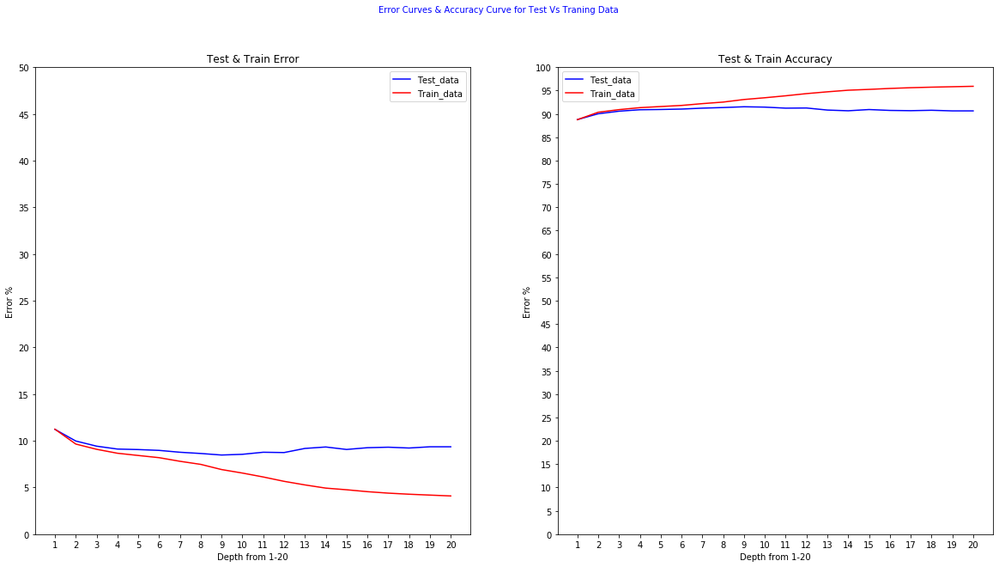

In [13]:
x=np.arange(1,max_depth+1,1)
fig, axes = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
axes[0].plot(x,test_error,color='blue',label='Test_data')
axes[0].plot(x,train_error,color='red',label='Train_data')

axes[1].plot(x,test_accuracy,color='blue',label='Test_data')
axes[1].plot(x,train_accuracy,color='red',label='Train_data')

fig.suptitle('Error Curves & Accuracy Curve for Test Vs Traning Data',fontsize=10,color='Blue')
axes[0].legend()
axes[0].set_xticks(x)
axes[0].set_yticks(np.arange(0,55,5))
axes[0].set_xlabel('Depth from 1-20' )
axes[0].set_ylabel('Error %')
axes[0].set_title('Test & Train Error')
axes[1].legend()
axes[1].set_xticks(x)
axes[1].set_yticks(np.arange(0,105,5))
axes[1].set_xlabel('Depth from 1-20' )
axes[1].set_ylabel('Error %')
axes[1].set_title('Test & Train Accuracy')

In [94]:
clf_entropy = tarin_using_entropy(X_train, y_train,9)  

print("Results Using Entropy:") 
# Prediction using entropy 
y_pred_entropy_test = prediction(X_test, clf_entropy) 
cal_accuracy(y_test, y_pred_entropy_test)
print("Test Error",compute_error(y_test, y_pred_entropy_test)*100)



y_pred_entropy_val = prediction(X_val, clf_entropy) 
cal_accuracy(y_val, y_pred_entropy_val)
print("Validation Error",compute_error(y_val, y_pred_entropy_val)*100)



y_pred_entropy_train = prediction(X_train, clf_entropy) 
cal_accuracy(y_train, y_pred_entropy_train)
print("Train Error",compute_error(y_train, y_pred_entropy_train)*100)


Results Using Entropy:
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7731  314]
 [ 465  552]]
Accuracy :  91.40366365040829
Report :                precision    recall  f1-score   support

           0       0.94      0.96      0.95      8045
           1       0.64      0.54      0.59      1017

    accuracy                           0.91      9062
   macro avg       0.79      0.75      0.77      9062
weighted avg       0.91      0.91      0.91      9062

Error:  0.08596336349591702
Test Error 8.596336349591702
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[6189  263]
 [ 347  450]]
Accuracy :  91.5850462132708
Report :                precision    recall  f1-score   support

           0       0.95      0.96      0.95      6452
           1       0.63      0.56      0.60       797

    accuracy                           0.92      7249
   macro avg       0.79      0.76      0.77      7249
weighted avg       0.91      0.92      0.91      7249

Error:  0.0841495378672

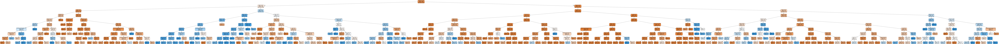

In [29]:
from IPython.display import display, Image
import pydotplus
from sklearn import tree
from sklearn.tree import _tree
from sklearn import tree
import collections
import drawtree
import os  

#os.environ["PATH"] += os.pathsep + 'C:\\Users\\User\\.conda\\pkgs\\graphviz-2.38-hfd603c8_2\\Library\\bin\\graphviz'

dot_data = tree.export_graphviz(clf_entropy, out_file = 'thisIsTheImagetree.dot',
                                 feature_names=features, filled   = True
                                    , rounded  = True
                                    , special_characters = True)

graph = pydotplus.graph_from_dot_file('thisIsTheImagetree.dot')  

thisIsTheImage = Image(graph.create_png())
display(thisIsTheImage)
#print(dt.tree_.feature)

In [ ]:
##Gini Index

In [59]:
clf_gini = tarin_using_gini(X_train, y_train,9)  

print("Results Using Gini:") 
# Prediction using entropy 
y_pred_gini_test = prediction(X_test, clf_gini) 
cal_accuracy(y_test, y_pred_gini_test)
print("Test Error",compute_error(y_test, y_pred_gini_test)*100)

y_pred_gini_val = prediction(X_val, clf_gini) 
cal_accuracy(y_val, y_pred_gini_val)
print("Validation Error",compute_error(y_val, y_pred_gini_val)*100)

# Prediction using entropy 
y_pred_gini_train = prediction(X_train, clf_gini) 
cal_accuracy(y_train, y_pred_gini_train)
print("Train Error",compute_error(y_train, y_pred_gini_train)*100)


Results Using Gini:
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7756  289]
 [ 529  488]]
Accuracy :  90.97329507834915
Report :                precision    recall  f1-score   support

           0       0.94      0.96      0.95      8045
           1       0.63      0.48      0.54      1017

    accuracy                           0.91      9062
   macro avg       0.78      0.72      0.75      9062
weighted avg       0.90      0.91      0.90      9062

Error:  0.09026704921650851
Test Error 9.02670492165085
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[6214  238]
 [ 382  415]]
Accuracy :  91.44709615119326
Report :                precision    recall  f1-score   support

           0       0.94      0.96      0.95      6452
           1       0.64      0.52      0.57       797

    accuracy                           0.91      7249
   macro avg       0.79      0.74      0.76      7249
weighted avg       0.91      0.91      0.91      7249

Error:  0.0855290384880673

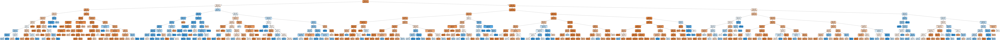

In [60]:
from IPython.display import display, Image
import pydotplus
from sklearn import tree
from sklearn.tree import _tree
from sklearn import tree
import collections
import drawtree
import os  

#os.environ["PATH"] += os.pathsep + 'C:\\Users\\User\\.conda\\pkgs\\graphviz-2.38-hfd603c8_2\\Library\\bin\\graphviz'

dot_data = tree.export_graphviz(clf_gini, out_file = 'thisIsTheImagetree.dot',
                                 feature_names=features, filled   = True
                                    , rounded  = True
                                    , special_characters = True)

graph = pydotplus.graph_from_dot_file('thisIsTheImagetree.dot')  

thisIsTheImage = Image(graph.create_png())
display(thisIsTheImage)
#print(dt.tree_.feature)

In [ ]:
##PCA Experiment

In [33]:
from sklearn.preprocessing import StandardScaler

x_Scalar = StandardScaler().fit_transform(X)

In [57]:
from sklearn.decomposition import PCA
pca = PCA(n_components=33)
principalComponents = pca.fit_transform(x_Scalar)
principalDf = pd.DataFrame(data = principalComponents)
             #, columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4'])


In [58]:
print (pca.explained_variance_)
print(pca.explained_variance_ratio_.cumsum())
print (pca.explained_variance_ratio_)


[4.43929812 2.80240604 2.32478592 2.30419058 2.04426659 1.92715207
 1.79292157 1.69841665 1.69509632 1.65435597 1.51612593 1.44734611
 1.25551951 1.19142607 1.15949756 1.11744963 1.11215067 1.05912554
 1.05332118 1.04208964 1.04079464 1.00728679 0.99007484 0.98858005
 0.98252993 0.96480896 0.93190178 0.88580547 0.85970093 0.81569569
 0.79378343 0.71312058 0.60668938]
[0.09248334 0.15086551 0.19929748 0.24730039 0.28988834 0.33003645
 0.36738816 0.40277106 0.43808479 0.47254977 0.50413503 0.53428741
 0.56044349 0.58526432 0.60941999 0.63269967 0.65586897 0.6779336
 0.6998773  0.72158702 0.74326977 0.76425445 0.78488055 0.80547551
 0.82594443 0.84604418 0.86545837 0.88391224 0.90182228 0.91881557
 0.93535236 0.95020871 0.96284779]
[0.09248334 0.05838217 0.04843197 0.04800291 0.04258795 0.04014812
 0.03735171 0.0353829  0.03531373 0.03446499 0.03158526 0.03015238
 0.02615608 0.02482083 0.02415567 0.02327969 0.02316929 0.02206463
 0.02194371 0.02170972 0.02168274 0.02098468 0.0206261  0.02

In [61]:
from sklearn.model_selection import train_test_split

X_train_80, X_test, y_train_80, y_test = train_test_split(principalDf, y, test_size=0.2, random_state=1)


X_train, X_val, y_train, y_val = train_test_split(X_train_80, y_train_80, test_size=0.2, random_state=1)

In [62]:
clf_pca_gini = tarin_using_gini(X_train, y_train,9)  

print("Results Using Gini:") 
# Prediction using entropy 
y_pred_pca_test = prediction(X_test, clf_pca_gini) 
cal_accuracy(y_test, y_pred_gini_test)
print("Test Error",compute_error(y_test, y_pred_pca_test)*100)

y_pred_pca_val = prediction(X_val, clf_pca_gini) 
cal_accuracy(y_val, y_pred_pca_val)
print("Validation Error",compute_error(y_val, y_pred_pca_val)*100)

# Prediction using entropy 
y_pred_pca_train = prediction(X_train, clf_pca_gini) 
cal_accuracy(y_train, y_pred_pca_train)
print("Train Error",compute_error(y_train, y_pred_pca_train)*100)


Results Using Gini:
Predicted values:
[0 0 0 ... 0 0 1]
Confusion Matrix:  [[7756  289]
 [ 529  488]]
Accuracy :  90.97329507834915
Report :                precision    recall  f1-score   support

           0       0.94      0.96      0.95      8045
           1       0.63      0.48      0.54      1017

    accuracy                           0.91      9062
   macro avg       0.78      0.72      0.75      9062
weighted avg       0.90      0.91      0.90      9062

Error:  0.10119178989185611
Test Error 10.119178989185611
Predicted values:
[0 0 0 ... 0 0 0]
Confusion Matrix:  [[6233  219]
 [ 497  300]]
Accuracy :  90.122775555249
Report :                precision    recall  f1-score   support

           0       0.93      0.97      0.95      6452
           1       0.58      0.38      0.46       797

    accuracy                           0.90      7249
   macro avg       0.75      0.67      0.70      7249
weighted avg       0.89      0.90      0.89      7249

Error:  0.09877224444751
V